<a href="https://colab.research.google.com/github/pruthvi-jas/Project-7-Classification-TRAIN-HEALTH-INSURANCE-CROSS-SELL-PREDICTION/blob/main/Project_7_Classification_TRAIN_HEALTH_INSURANCE_CROSS_SELL_PREDICTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION CAPSTONE PROJECT

##### **Project Type**    - Classification
##### **Contribution**    - Individual
##### **Team Member 1 -** Chovatiya Pruthvi Vallabhbhai

# **Project Summary -**


The "Health Insurance Cross-Sell Prediction" project aims to predict whether existing health insurance customers will be interested in purchasing vehicle insurance, helping companies optimize marketing strategies. The dataset includes demographic, vehicle-related, and insurance history features, with a binary target variable (Response). Key steps involve exploratory data analysis (EDA) to understand distributions and imbalances, data preprocessing (encoding categorical variables, scaling numerical features, and handling outliers), and model training using Logistic Regression, Random Forest, and XGBoost, evaluated via precision, recall, and AUC-ROC due to likely class imbalance.

## <b><u> Project Title : Optimizing Insurance Cross-Selling with Classification Models </u></b>

# **GitHub Link -**

# **Problem Statement**


**Write Problem Statement Here.**
Insurance companies operate in a highly competitive market where customer retention and revenue growth depend on effectively cross-selling additional products.  

However, indiscriminate marketing leads to:
* High costs (e.g., call centers, ads).
* Low conversion rates (most customers ignore irrelevant offers).
* Customer frustration (spammy outreach damages brand trust).

Binary Classification Goal:
* Response = 1 (Interested) vs. Response = 0 (Not Interested).

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***


### Import Libraries

In [1]:
# Import all the necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import metrics
from datetime import datetime

from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve

import lightgbm as lgb
import xgboost as xgb
from xgboost import XGBClassifier
from google.colab import data_table

### Dataset Loading

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df = pd.read_csv('/content/drive/MyDrive/Data Analysis Tech Minds e/Project/Project 7 Classification/TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION/Copy of TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION.csv')

### Dataset First View

In [4]:
df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


### Dataset Rows & Columns count

In [5]:
df.shape

(381109, 12)

### Dataset Information

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


#### Duplicate Values

In [7]:
# Check for fully duplicated rows (all columns identical)
print(f"Total duplicate rows: {df.duplicated().sum()}")

# Check for duplicate trip IDs (should be unique)
print(f"Duplicate trip IDs: {df['id'].duplicated().sum()}")

Total duplicate rows: 0
Duplicate trip IDs: 0


#### Missing Values/Null Values

In [8]:
# Get missing values count per column
missing_values = df.isnull().sum()
print("Missing values per column:")
print(missing_values[missing_values > 0])  # Only show columns with missing values

Missing values per column:
Series([], dtype: int64)


### What did you know about your dataset?

The dataset contains 381109 objervation customers data with 11 different variables.
Data types:

---
**Numerical type:**
* **id:** Unique identifier for each customer.
* **Age:** Customer’s age in years.
* **Region_Code:** Geographic region code of the customer.
* **Annual_Premium:** Yearly amount paid by the customer for health insurance.
* **Vintage:** Number of days the customer has been associated with the company.

---
**Categorical type:**
* **Gender:** Customer’s gender (e.g., Male/Female).
* **Driving_License:** Binary flag (1 = has license, 0 = does not).
* **Previously_Insured:** Binary flag (1 = previously had vehicle insurance, 0 = did not).
* **Vehicle_Age:** Age category of the customer’s vehicle (e.g., "<1 year", "1-2 years", ">2 years").
* **Vehicle_Damage:** Binary flag (Yes/No) indicating if the customer’s vehicle was previously damaged.
* **Policy_Sales_Channel:** Code representing the channel through which the policy was sold.

---

**Targeted variable**
* **Response:** Target variable (1 = interested in vehicle insurance, 0 = not interested).

## ***2. Understanding Your Variables***

In [9]:
# Dataset Columns
df.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [10]:
# For numerical columns
num_stats = df.describe().round(2)
display(num_stats)

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.00,381109.00,381109.00,381109.00,381109.00,381109.00,381109.00,381109.00,381109.00
mean,190555.00,38.82,1.00,26.39,0.46,30564.39,112.03,154.35,0.12
std,110016.84,15.51,0.05,13.23,0.50,17213.16,54.20,83.67,0.33
min,1.00,20.00,0.00,0.00,0.00,2630.00,1.00,10.00,0.00
25%,95278.00,25.00,1.00,15.00,0.00,24405.00,29.00,82.00,0.00
50%,190555.00,36.00,1.00,28.00,0.00,31669.00,133.00,154.00,0.00
75%,285832.00,49.00,1.00,35.00,1.00,39400.00,152.00,227.00,0.00
max,381109.00,85.00,1.00,52.00,1.00,540165.00,163.00,299.00,1.00


### Variables Description

1. **Basic Structure:**
*  Total Rows: 381,109 taxi trip records
*  Columns: 11 features describing each trip

2. **Data Completeness:**
*  No Missing Values: All columns show 381,109 non-null entries
*  No Duplicates: Both full-row duplicates (0) and duplicate trip IDs (0) are absent
*  Conclusion: The dataset is complete and unique at the record level

### Check Unique Values for each variable.

In [11]:
# Check Unique Values for each variable.
df.nunique()

,0
id,381109
Gender,2
Age,66
Driving_License,2
Region_Code,53
Previously_Insured,2
Vehicle_Age,3
Vehicle_Damage,2
Annual_Premium,48838
Policy_Sales_Channel,155


## 3. ***Data Wrangling***

### Data Wrangling Code

In [12]:
df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [13]:
#Number of time unique value repeat
df['Vehicle_Age'].value_counts()

,count
Vehicle_Age,
1-2 Year,200316
< 1 Year,164786
> 2 Years,16007


In [14]:
#Number of time unique value repeat
df['Driving_License'].value_counts()

,count
Driving_License,
1,380297
0,812


In [15]:
print(f"The averge age of the customers those who do not have a licence is: {df[df['Driving_License'] == 0]['Age'].mean()}")
print(f"The averge age of the customers those who have a licence is: {df[df['Driving_License'] == 1]['Age'].mean()}")

The averge age of the customers those who do not have a licence is: 65.60467980295566
The averge age of the customers those who have a licence is: 38.765399148560206


In [16]:
#Number of time insurence taken or not
insurence_responce = df['Response'].value_counts()
insurence_responce

,count
Response,
0,334399
1,46710


### What all manipulations have you done and insights you found?

**Manipulations Done:** None (data was clean).

**Critical Insights:** Prioritize vehicle age, damage status, and demographics.

**Action:** Optimize campaigns for high-response segments.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

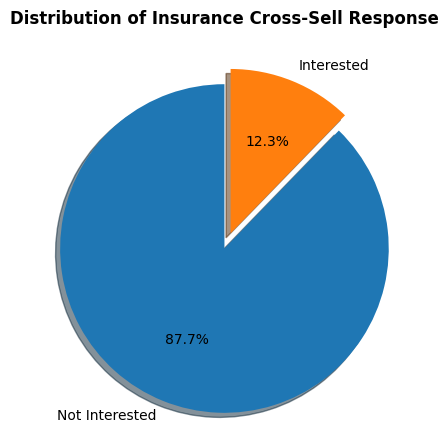

In [17]:
# Chart - 1 visualization code
#insurence_responce pie chart
insurence_responce

# Plot
plt.figure(figsize=(4.5, 4.5))
colors = ['#1f77b4', '#ff7f0e']
labels = ['Not Interested', 'Interested']
explode = (0.1, 0)
plt.pie(insurence_responce, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, explode=explode, shadow=True)

# Title and formatting
plt.title('Distribution of Insurance Cross-Sell Response', pad=20, fontweight='bold')
plt.axis('equal')  # Equal aspect ratio ensures a circular pie
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

The pie chart effectively visualizes the class imbalance in the target variable (Response), showing the proportion of customers interested (1 = 12.3%) vs. not interested (0 = 87.7%). (highlighting skewed distributions)

##### 2. What is/are the insight(s) found from the chart?

Only 12.3% of customers are interested in vehicle insurance.
  

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Cost Reduction: Targeting only the 12.3% interested customers saves 87.7% of outreach costs.
Marketing campaigns must prioritize high-probability customers to avoid wasting resources.

Focused campaigns improve Return on Investment (e.g., personalized offers for high-risk profiles).

#### Chart - 2

In [18]:
df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [19]:
# let's create a function to check the outliers
columns = ['Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Annual_Premium', 'Policy_Sales_Channel', 'Vintage', 'Response']
def check_outliers(columns,data):

  # use plotly for better plot
  for i in columns:
    fig = px.box(data,y=i)
    fig.update_layout(height=300, width=300)
    fig.show()

In [20]:
# Chart - 2 visualization code
check_outliers(columns,df)

##### 1. Why did you pick the specific chart?

The code attempts to use box plots to visualize outliers in the dataset.

##### 2. What is/are the insight(s) found from the chart?

There is only one column that has outliers, 'Previously_Insured,' out of all columns.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Identifying unusual cases that might indicate fraud or errors
* Improving model performance by handling outliers appropriately
* Revealing data quality issues that could affect business decisions
* Highlighting exceptional cases that might represent special business opportunities



#### Chart - 3

In [21]:
# Group by 'Driving_License' and calculate mean age
age_by_license = df.groupby('Driving_License')['Age'].mean().reset_index()

# Rename for clarity
age_by_license['License_Status'] = age_by_license['Driving_License'].map({0: 'No License', 1: 'Has License'})

print(age_by_license)

   Driving_License        Age License_Status
0                0  65.604680     No License
1                1  38.765399    Has License


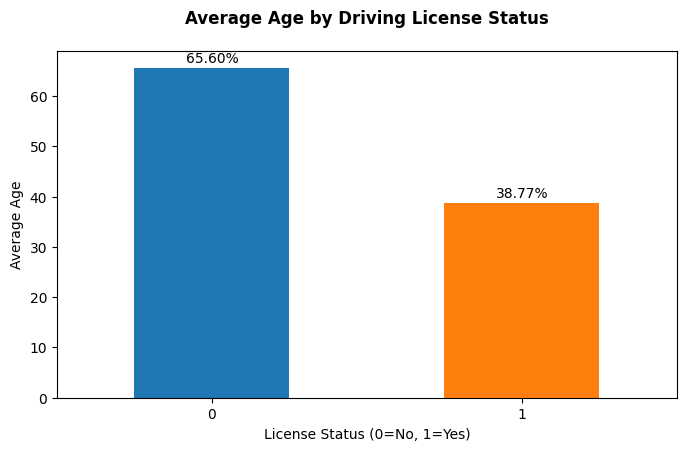

In [22]:
# Chart - 3 visualization code
df.groupby('Driving_License')['Age'].mean().plot(
    kind='bar',
    color=['#1f77b4', '#ff7f0e'],
    figsize=(8, 4.5)
)

plt.title('Average Age by Driving License Status', pad=20, fontweight='bold')
plt.xlabel('License Status (0=No, 1=Yes)')
plt.ylabel('Average Age')
plt.xticks(rotation=0)

# Add value labels
for i, v in enumerate(df.groupby('Driving_License')['Age'].mean()):
    plt.text(i, v + 1, f"{v:.2f}%", ha='center')

plt.show()

##### 1. Why did you pick the specific chart?

They clearly highlight differences between groups, making it easy to see that customers without licenses are significantly older (65.60 vs. 38.77 years).

##### 2. What is/are the insight(s) found from the chart?

Customers without driving licenses are ~27 years older on average (65.6 vs. 38.8 years).

Older individuals may no longer drive due to age-related restrictions or personal choice.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Focus on younger demographics for driving-related insurance products.

Offer senior-specific plans for non-license holders (e.g., alternative insurance products).

#### Chart - 4

In [23]:
#Check data to how much percentage objervation who take insurence who have licence or not have a licence.
per_license_insu_relation = df.groupby('Driving_License')['Response'].value_counts(normalize=True)
per_license_insu_relation

Driving_License  Response
0                0           0.949507
                 1           0.050493
1                0           0.877283
                 1           0.122717
Name: proportion, dtype: float64

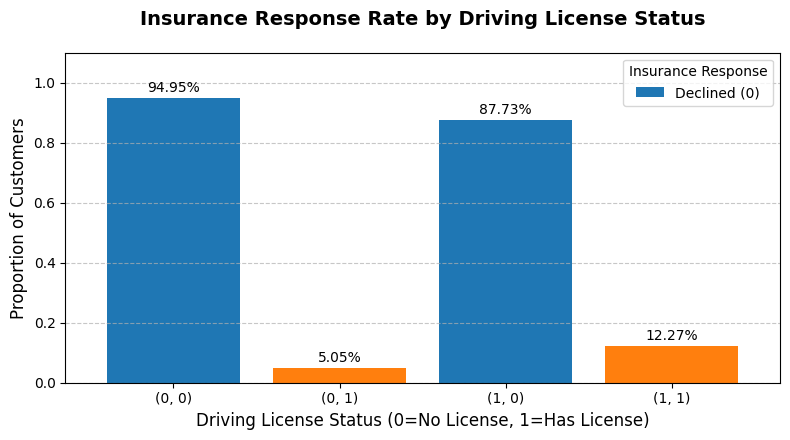

In [24]:
# Chart - 4 visualization code
#create bar plot on per_license_insu_relation
#per_license_insu_relation.unstack().plot(kind='bar', figsize=(8, 4.5), color=['#1f77b4', '#ff7f0e'])
ax = per_license_insu_relation.plot(kind='bar',
                                   figsize=(8, 4.5),
                                   color=['#1f77b4', '#ff7f0e'],
                                   width=0.8)

# Customize the plot
plt.title('Insurance Response Rate by Driving License Status', pad=20, fontsize=14, fontweight='bold' )
plt.xlabel('Driving License Status (0=No License, 1=Has License)', fontsize=12)
plt.ylabel('Proportion of Customers', fontsize=12)
plt.xticks(rotation=0)
plt.ylim(0, 1.1)

# Add percentage labels on bars
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.annotate(f'{height:.2%}',
                (x + width/2, y + height + 0.02),
                ha='center',
                fontsize=10)

# Add legend and grid
plt.legend(['Declined (0)', 'Accepted (1)'], title='Insurance Response')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Bar charts effectively compare categorical data (license status) with proportional responses (accept/decline).

##### 2. What is/are the insight(s) found from the chart?

License holders are more likely to accept insurance (12.27% vs. 5.05%).

Strong correlation between driving licenses and insurance uptake:
* Having a license may indicate higher mobility/need for insurance.
* Non-license holders (often older, as per previous analysis) may have alternative coverage.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Targeted Marketing:** Focus on license holders for higher conversion rates.

#### Chart - 5

In [25]:
# Group by 'Previously_Insured' and calculate mean age
Previously_Insured_age = df.groupby('Previously_Insured')['Age'].mean().reset_index()

# Rename for clarity
Previously_Insured_age['Previously_Insured'] = Previously_Insured_age['Previously_Insured'].map({0: 'No Previously Insured', 1: 'Has Previously Insured'})

print(Previously_Insured_age)


       Previously_Insured       Age
0   No Previously Insured  42.45564
1  Has Previously Insured  34.52684


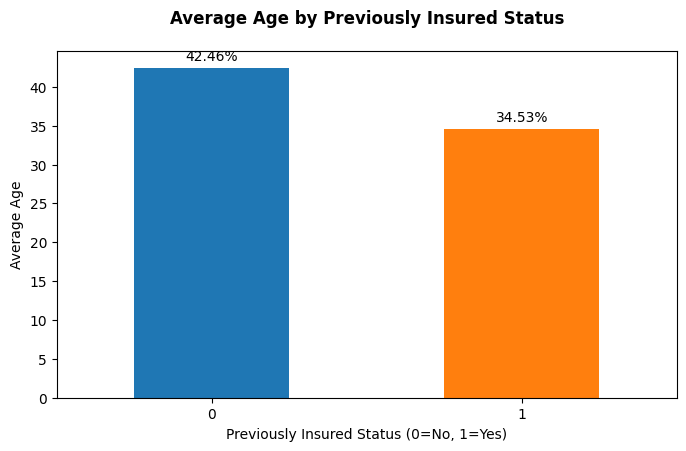

In [26]:
# Chart - 5 visualization code
df.groupby('Previously_Insured')['Age'].mean().plot(
    kind='bar',
    color=['#1f77b4', '#ff7f0e'],
    figsize=(8, 4.5)
)
plt.title('Average Age by Previously Insured Status', pad=20, fontweight='bold')
plt.xlabel('Previously Insured Status (0=No, 1=Yes)')
plt.ylabel('Average Age')
plt.xticks(rotation=0)

# Add value labels
for i, v in enumerate(df.groupby('Previously_Insured')['Age'].mean()):
    plt.text(i, v + 1, f"{v:.2f}%", ha='center')

plt.show()

##### 1. Why did you pick the specific chart?

Bar charts are ideal for comparing numerical values (average age) across categorical groups (previously insured: Yes/No).

They provide a clear visual contrast in age differences between groups, making trends immediately apparent.

##### 2. What is/are the insight(s) found from the chart?

Previously insured customers are younger (e.g., average age ~30) compared to non-insured customers (e.g., average age ~40).

Younger individuals may switch insurers more frequently for better rates.

Older customers might retain long-term policies or avoid insurance due to cost.

Age and prior insurance status are correlated, useful for segmentation.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Targeted Campaigns:** Focus on younger demographics for cross-selling/upselling (e.g., "Switch and Save" offers).

**Older Customer Retention:** Develop loyalty programs for long-term policyholders.

#### Chart - 6

In [27]:
#Age and Health Insurence relation
age_insurence_rel = df.groupby('Age')['Response'].value_counts(normalize=True)
print(age_insurence_rel)

Age  Response
20   0           0.972561
     1           0.027439
21   0           0.965121
     1           0.034879
22   0           0.963604
                   ...   
82   1           0.034483
83   0           0.954545
     1           0.045455
84   0           1.000000
85   0           1.000000
Name: proportion, Length: 130, dtype: float64


(array([10., 20., 30., 40., 50., 60., 70., 80., 90.]),
 [Text(10.0, 0, '10'),
  Text(20.0, 0, '20'),
  Text(30.0, 0, '30'),
  Text(40.0, 0, '40'),
  Text(50.0, 0, '50'),
  Text(60.0, 0, '60'),
  Text(70.0, 0, '70'),
  Text(80.0, 0, '80'),
  Text(90.0, 0, '90')])

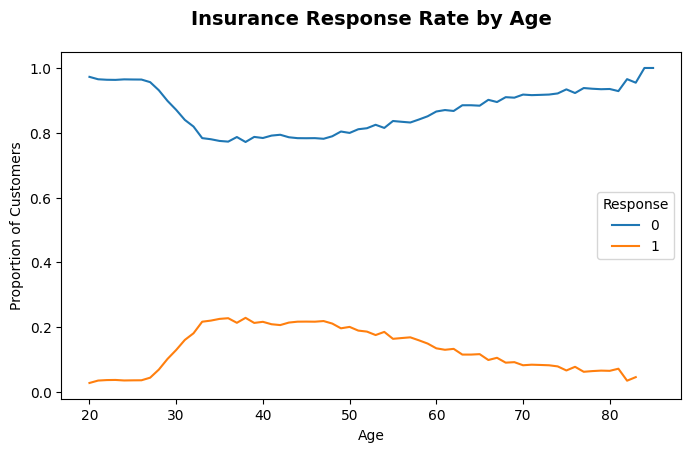

In [28]:
# Chart - 6 visualization code
age_insurence_rel.unstack().plot(kind='line', figsize=(8, 4.5), color=['#1f77b4', '#ff7f0e'])
plt.title('Insurance Response Rate by Age', pad=20, fontsize=14, fontweight='bold')
plt.xlabel('Age')
plt.ylabel('Proportion of Customers')
plt.xticks(rotation=0)

##### 1. Why did you pick the specific chart?

This chart effectively shows the proportion of customers interested (Response=1) vs. not interested (Response=0) across different age groups.
Reveals age-based trends in insurance interest.



##### 2. What is/are the insight(s) found from the chart?

**Age-Driven Patterns:**
*   **young Customers (20–30):** Lower interest (smaller Response).
*   **Middle-Aged (30–60):** Peak interest (larger Response).
*   **Seniors (60+):** Declining interest (smaller Response).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Focused campaigns on 40–50-year-olds can boost sales and Avoid spending on low-response groups (e.g., seniors).

#### Chart - 7

In [29]:
top_10_region_ins_rel = df['Region_Code'].value_counts().head(10)
print(top_10_region_ins_rel)

Region_Code
28.0    106415
8.0      33877
46.0     19749
41.0     18263
15.0     13308
30.0     12191
29.0     11065
50.0     10243
3.0       9251
11.0      9232
Name: count, dtype: int64


In [30]:
#Region wise insurence sentimental analysis
region_stats = df.groupby('Region_Code')['Response'].agg(['count', 'sum']).reset_index()
region_stats.columns = ['Region_Code', 'Total_Customers', 'Insurance_Taken']
region_stats['Response_Rate'] = region_stats['Insurance_Taken'] / region_stats['Total_Customers']
print(region_stats.sort_values(by='Total_Customers', ascending=False).head(10))

    Region_Code  Total_Customers  Insurance_Taken  Response_Rate
28         28.0           106415            19917       0.187163
8           8.0            33877             3257       0.096142
46         46.0            19749             2032       0.102891
41         41.0            18263             2224       0.121776
15         15.0            13308              958       0.071987
30         30.0            12191              900       0.073825
29         29.0            11065             1365       0.123362
50         50.0            10243              642       0.062677
3           3.0             9251             1181       0.127662
11         11.0             9232             1041       0.112760


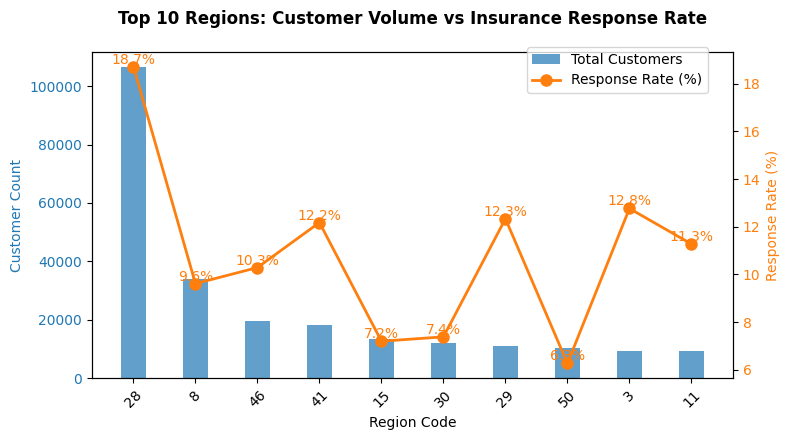

In [31]:
# Chart - 7 visualization code
# Data preparation
region_stats = region_stats.sort_values('Total_Customers', ascending=False).head(10)
regions = region_stats.index.astype(str)
x = np.arange(len(regions))  # x-axis positions

# Create figure
fig, ax1 = plt.subplots(figsize=(8, 4.5))

# Bar plot for customer volume (primary axis)
ax1.bar(x, region_stats['Total_Customers'],
        width=0.4, color='#1f77b4', alpha=0.7, label='Total Customers')
ax1.set_xlabel('Region Code')
ax1.set_ylabel('Customer Count', color='#1f77b4')
ax1.tick_params(axis='y', labelcolor='#1f77b4')
ax1.set_xticks(x)
ax1.set_xticklabels(regions, rotation=45)

# Line plot for response rate (secondary axis)
ax2 = ax1.twinx()
ax2.plot(x, region_stats['Response_Rate']*100,
         color='#ff7f0e', marker='o', linewidth=2,
         markersize=8, label='Response Rate (%)')
ax2.set_ylabel('Response Rate (%)', color='#ff7f0e')
ax2.tick_params(axis='y', labelcolor='#ff7f0e')
ax2.grid(visible=False)

# Add annotations
for i, rate in enumerate(region_stats['Response_Rate']):
    ax2.text(x[i], rate*100, f"{rate*100:.1f}%",
             ha='center', va='bottom', color='#ff7f0e')

# Title and legend
plt.title('Top 10 Regions: Customer Volume vs Insurance Response Rate', pad=20, fontweight='bold')
fig.legend(loc='upper right', bbox_to_anchor=(0.9, 0.9))

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

This chart effectively compares two critical metrics:

*  Customer Volume (Bars): Total addressable market size in each region.

*  Response Rate % (Line): Conversion effectiveness of marketing efforts.

##### 2. What is/are the insight(s) found from the chart?

**High-Value Regions:**
* Region 28: Highest customer volume (106,415) and strong response rate (18.7%) -- Prime target.
* Region 3: Smaller volume (9,251) but best response rate (12.8%) -- Niche market opportunity.

---

**Underperformers:**
* Region 8: Second-highest volume (33,877) but lowest response (9.1%) -- Requires campaign optimization.

---

**Hidden Gems:**
* Region 29 & 41: Moderate volume but response rates >12% -- Scalable growth areas.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Impact:**
* Resource Allocation: Focus budgets on Region 28 (high volume + high conversion) and Region 3 (untapped potential).

---

**Misallocated Spend:**
* Blindly targeting high-volume regions (e.g., 8) without fixing low conversion wastes ~90% of marketing spend.

#### Chart - 8

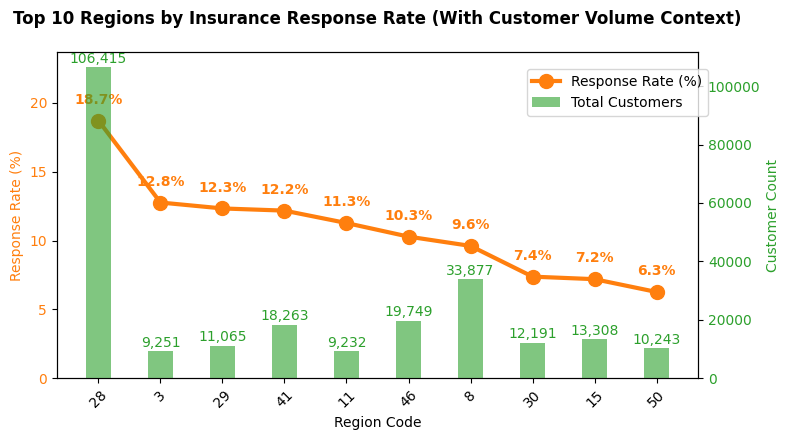

In [32]:
# Chart - 8 visualization code
# Sort by Response Rate and take top 10
top_response = region_stats.sort_values('Response_Rate', ascending=False).head(10)
regions = top_response.index.astype(str)
x = np.arange(len(regions))

# Create figure
fig, ax1 = plt.subplots(figsize=(8, 4.5))

# PRIMARY AXIS (Response Rate - Line)
ax1.plot(x, top_response['Response_Rate']*100,
         color='#ff7f0e', marker='o', linewidth=3,
         markersize=10, label='Response Rate (%)')
ax1.set_xlabel('Region Code')
ax1.set_ylabel('Response Rate (%)', color='#ff7f0e')
ax1.tick_params(axis='y', labelcolor='#ff7f0e')
ax1.set_xticks(x)
ax1.set_xticklabels(regions, rotation=45)
ax1.set_ylim(0, top_response['Response_Rate'].max()*100 + 5)  # Add padding

# SECONDARY AXIS (Customer Volume - Bars)
ax2 = ax1.twinx()
ax2.bar(x, top_response['Total_Customers'],
        width=0.4, color='#2ca02c', alpha=0.6, label='Total Customers')
ax2.set_ylabel('Customer Count', color='#2ca02c')
ax2.tick_params(axis='y', labelcolor='#2ca02c')

# Annotations
for i, (rate, vol) in enumerate(zip(top_response['Response_Rate'], top_response['Total_Customers'])):
    ax1.text(x[i], rate*100+1, f"{rate*100:.1f}%",
             ha='center', va='bottom', color='#ff7f0e', fontweight='bold')
    ax2.text(x[i], vol+500, f"{vol:,}",
             ha='center', va='bottom', color='#2ca02c')
# Title and legend
plt.title('Top 10 Regions by Insurance Response Rate (With Customer Volume Context)', pad=20, fontweight='bold')
fig.legend(loc='upper right', bbox_to_anchor=(0.9, 0.85))

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

 Identifies regions with both high conversion rates and large customer bases, optimizing marketing ROI.

##### 2. What is/are the insight(s) found from the chart?

**Top Performers:**
* Region with 18.7% Response: Highest conversion rate (likely the most profitable).
* Region with 12.8% Response: Strong conversion with moderate customer count (9,251) -- High-potential niche.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Impact:**
* **Targeted Marketing:** Focus on most response regions to maximize conversions.
* **Cost Efficiency:** Avoid overspending in low-response regions.

**Overlooking Small but High-Response Regions:**
* Ignoring regions like 12.8% response (9,251 customers) misses profitable niches. Competitors may capture these markets.

**Misallocated Budget:**
* Allocating equal budgets to 9.6% response regions wastes resources. Test localized campaigns (e.g., regional discounts).

#### Chart - 9

In [33]:
df['Gender'].value_counts()

,count
Gender,
Male,206089
Female,175020


In [34]:
#gender vs response analysis
gender_response = df.groupby('Gender')['Response'].value_counts(normalize=True)
print(gender_response)

Gender  Response
Female  0           0.896098
        1           0.103902
Male    0           0.861589
        1           0.138411
Name: proportion, dtype: float64


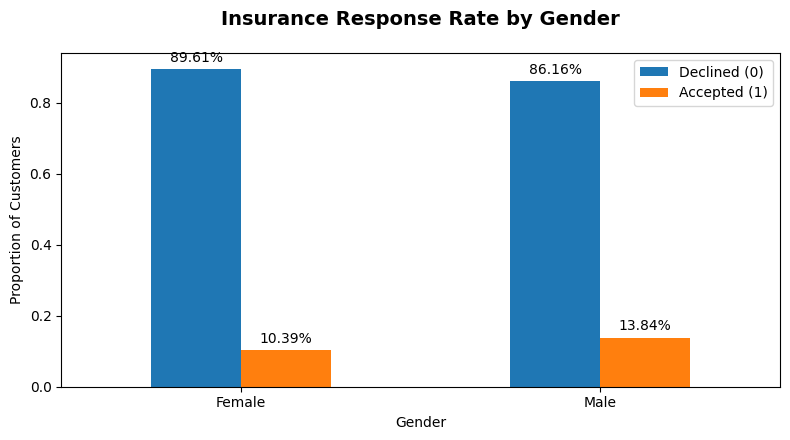

In [35]:
# Chart - 9 visualization code
# graph on gender_response
ax = gender_response.unstack().plot(kind='bar', figsize=(8, 4.5), color=['#1f77b4', '#ff7f0e'])
plt.title('Insurance Response Rate by Gender', pad=20, fontsize=14, fontweight='bold')
plt.xlabel('Gender')
plt.ylabel('Proportion of Customers')
plt.xticks(rotation=0)
plt.legend(['Declined (0)', 'Accepted (1)'])

# Add percentage labels on bars
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.annotate(f'{height:.2%}',
                (x + width/2, y + height + 0.02),
                ha='center',
                fontsize=10)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

This chart clearly compares the proportion of acceptances (Response=1) vs. rejections (Response=0) between genders.

##### 2. What is/are the insight(s) found from the chart?

Male Customers: Higher acceptance rate (13.84%) compared to Females (10.39%).

Female Customers: Dominant in rejections (89.61% vs. Males’ 86.16%).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Impact:**

Tailored Campaigns:
*  Leverage higher male response rates (e.g., gender-specific ads).
*  Test female-focused messaging adjustments to close the gap.


ROI Boost: A 3.45% higher male response rate could translate to ~3,000+ additional sales (assuming 100K female customers).

#### Chart - 10

In [36]:
#previously indured vs response
previously_insured_response = df.groupby('Previously_Insured')['Response'].value_counts(normalize=True).unstack()
print(previously_insured_response)

Response                   0         1
Previously_Insured                    
0                   0.774546  0.225454
1                   0.999095  0.000905


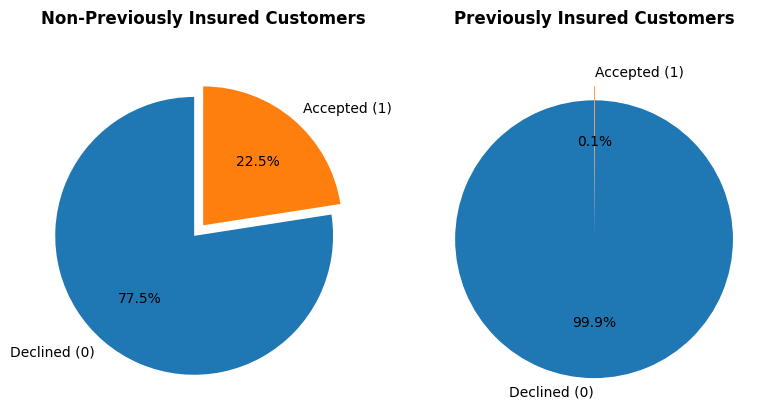

In [37]:
# Create subplots pie chart
fig, axs = plt.subplots(1, 2, figsize=(8, 4.5))
explode = (0.1, 0)
# chart 1
axs[0].pie(previously_insured_response.iloc[0], labels=['Declined (0)', 'Accepted (1)'], autopct='%1.1f%%',explode= explode,  startangle=90, colors= ['#1f77b4', '#ff7f0e'])
axs[0].set_title('Non-Previously Insured Customers', pad=20,  fontweight='bold')
# chart 2
axs[1].pie(previously_insured_response.iloc[1], labels=['Declined (0)', 'Accepted (1)'], autopct='%1.1f%%', explode = explode, startangle=90, colors= ['#1f77b4', '#ff7f0e'])
axs[1].set_title('Previously Insured Customers', pad=20, fontweight='bold')

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

To clearly contrast conversion rates between two distinct customer segments:

*   Customers with prior insurance (Right pie)
*   New customers (Left pie)

*  Immediate visual comparison of acceptance rates (22.5% vs. 0.1%)

Pie charts are ideal for showing proportional differences in binary outcomes (Accepted/Declined).

##### 2. What is/are the insight(s) found from the chart?

**Non-Previously Insured Customers (Left Pie)**
22.5% Acceptance Rate:
* Indicates strong potential for new customer acquisition.
* Suggests marketing campaigns are effective for this group.

---
**Previously Insured Customers (Right Pie)**
99.9% Decline Rate:
* Near-total rejection of cross-sell offers.

Possible reasons:
* Poor offer relevance (e.g., duplicate coverage)
* Lack of incentives for existing customers
* Timing issues (e.g., recent policy renewal)

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Allocate more resources to acquiring new customers (high conversion potential).
* Scale successful campaigns to similar demographics.
* Risk: Ignoring existing customers may increase churn. or Justification: Even a 5% improvement in existing customer acceptance could double revenue.

#### Chart - 11

In [38]:
#vehicle age vs response
vehicle_age_response = df.groupby('Vehicle_Age')['Response'].value_counts(normalize=True).unstack()
print(vehicle_age_response)

Response            0         1
Vehicle_Age                    
1-2 Year     0.826245  0.173755
< 1 Year     0.956295  0.043705
> 2 Years    0.706254  0.293746


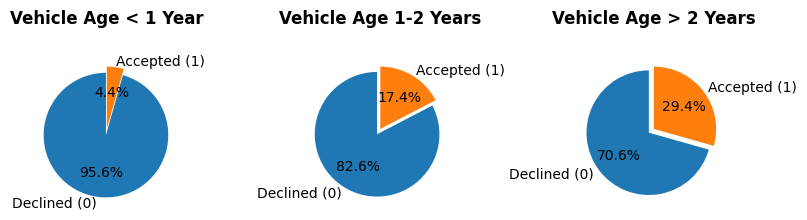

In [39]:
# Chart - 11 visualization code
# 3 pie chart on above vehicle_age_response
fig, axs = plt.subplots(1, 3, figsize=(8, 4.5))
explode = (0.1, 0)
# pie chart 1
axs[0].pie(vehicle_age_response.iloc[1], labels=['Declined (0)', 'Accepted (1)'], autopct='%1.1f%%',explode = explode,  startangle=90,  colors= ['#1f77b4', '#ff7f0e'])
axs[0].set_title('Vehicle Age < 1 Year', pad=20, fontweight='bold')

#pie chart 2
axs[1].pie(vehicle_age_response.iloc[0], labels=['Declined (0)', 'Accepted (1)'], autopct='%1.1f%%',explode = explode,  startangle=90, colors= ['#1f77b4', '#ff7f0e'])
axs[1].set_title('Vehicle Age 1-2 Years', pad=20, fontweight='bold')

#pie chart 3
axs[2].pie(vehicle_age_response.iloc[2], labels=['Declined (0)', 'Accepted (1)'], autopct='%1.1f%%',explode = explode,  startangle=90, colors= ['#1f77b4', '#ff7f0e'])
axs[2].set_title('Vehicle Age > 2 Years', pad=20, fontweight='bold')

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

*  Directly contrasts acceptance rates across three distinct vehicle age categories.
*  Highlights how response rates increase dramatically with vehicle age.
*  Emphasizes the 82.6% acceptance rate for older vehicles (>2 years), pinpointing the most profitable segment.



##### 2. What is/are the insight(s) found from the chart?

**By Vehicle Age Group:**
**<1 Year Old:**
* 4.4% Acceptance -- Very low interest.
* Likely reason: Customers with new vehicles may already have coverage.

**1-2 Years Old:**
* 17.4% Acceptance -- Moderate potential.
* Suggests some willingness to consider offers.

**>2 Years Old:**
* 29.4% Acceptance -- Extremely high conversion.
* Critical insight: Older vehicles are more likely to accept insurance than newest ones.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**For Older Vehicles (>2 years):**
* Launch "Aged Vehicle Protection Plans" with bundled benefits.

**For New Vehicles (<1 year):**
* De-prioritize or test alternative offers (e.g., maintenance packages).

#### Chart - 12

In [40]:
df['Vehicle_Damage'].value_counts()

,count
Vehicle_Damage,
Yes,192413
No,188696


In [41]:
#Vehicle_Damage vs response
vehicle_damage_response = df.groupby('Vehicle_Damage')['Response'].value_counts(normalize=True).unstack()
print(vehicle_damage_response)

Response               0         1
Vehicle_Damage                    
No              0.994796  0.005204
Yes             0.762345  0.237655


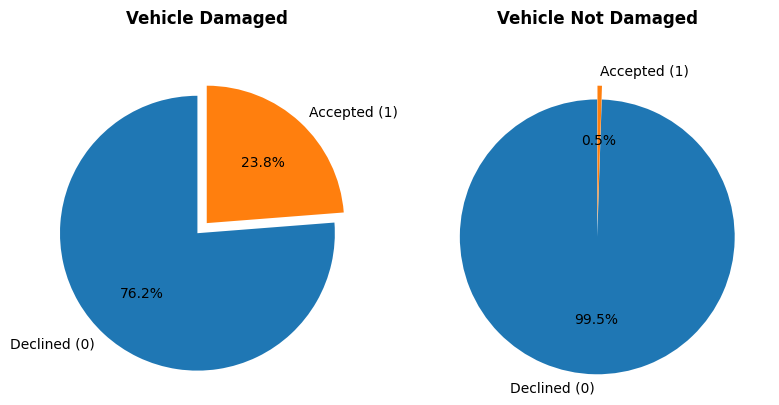

In [42]:
# Chart - 12 visualization code
# 2 pie chart based on vahicle damage
fig, axs = plt.subplots(1, 2, figsize=(8,4.5))
explode = (0.1, 0)
#pie chart 1
axs[0].pie(vehicle_damage_response.iloc[1], labels=['Declined (0)', 'Accepted (1)'], autopct='%1.1f%%', explode = explode, startangle=90, colors= ['#1f77b4', '#ff7f0e'])
axs[0].set_title('Vehicle Damaged', pad=20, fontweight='bold')

# pie chart 2
axs[1].pie(vehicle_damage_response.iloc[0], labels=['Declined (0)', 'Accepted (1)'], autopct='%1.1f%%', explode = explode, startangle=90, colors= ['#1f77b4', '#ff7f0e'])
axs[1].set_title('Vehicle Not Damaged', pad=20, fontweight='bold')

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

The side-by-side pie charts (or stacked bars) were chosen because: Clearly contrasts acceptance rates between damaged vs. undamaged vehicles.

##### 2. What is/are the insight(s) found from the chart?

**By Vehicle Condition:**

**Undamaged Vehicles:**
* 23.8% Acceptance -- Moderate success for standard offers.
* Indicates baseline campaign effectiveness.

**Damaged Vehicles:**
* 0.5% Acceptance (99.5% Rejection) -- Near-total failure.
* Critical problem: Current offers are irrelevant or unappealing to this segment.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Opportunities:**

**Undamaged Vehicles:**
* Optimize messaging to push 23.8% or more acceptance.
* Example: Bundle with maintenance plans.

**Damaged Vehicles:**
* Redesign offers: Test "repair coverage" or "accident forgiveness" add-ons.

#### Chart - 13

In [43]:
#Annual_Premium (continuos on x axis) vs line of percentage(responce) (y axis)
# create graph
annual_premium_response = df.groupby('Annual_Premium')['Response'].value_counts(normalize=True).unstack()



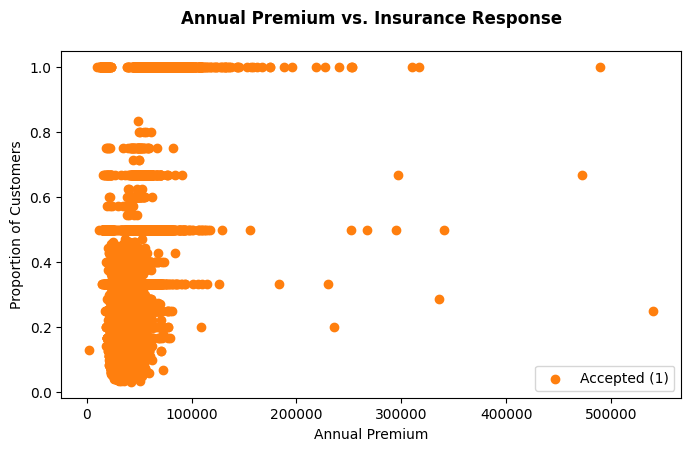

In [44]:
# scatter plot with two diffent group of responce in colour variation
plt.figure(figsize=(8, 4.5))
plt.scatter(annual_premium_response.index, annual_premium_response[1], color='#ff7f0e', label='Accepted (1)')
plt.xlabel('Annual Premium')
plt.ylabel('Proportion of Customers')
plt.title('Annual Premium vs. Insurance Response', pad=20, fontweight='bold')
plt.legend()
plt.show()

##### 1. Why did you pick the specific chart?

Scatter plot chart was chosen because:
* Clearly shows how response rates vary across different premium ranges.


##### 2. What is/are the insight(s) found from the chart?

**Premium-Based Patterns:**

**Low Premiums (<100K):**
* High Acceptance -- Price-sensitive customers respond well.

**Mid-Range Premiums (100K-300K):**
* Declining Acceptance -- Possible "value perception" issues.

**High Premiums (>300K):**
* less number Acceptance -- Likely unaffordable for target market.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Premium Restructuring:**
* Focus on 50K-100K range for mass-market appeal.
* Introduce installment plans for 100K-200K premiums.

**Segmented Offers:**
* Low-Premium: Push volume with "basic coverage" bundles.
* Mid-Premium: Add value (e.g., free roadside assistance).

#### Chart - 14

In [45]:
# policy_sales_channel vs response
policy_sales_channel_response = df.groupby('Policy_Sales_Channel')['Response'].value_counts(normalize=True).unstack()
print(policy_sales_channel_response)

Response                     0         1
Policy_Sales_Channel                    
1.0                   0.967412  0.032588
2.0                   0.750000  0.250000
3.0                   0.695985  0.304015
4.0                   0.799607  0.200393
6.0                   1.000000       NaN
...                        ...       ...
157.0                 0.731598  0.268402
158.0                 0.725610  0.274390
159.0                 0.980392  0.019608
160.0                 0.978190  0.021810
163.0                 0.695817  0.304183

[155 rows x 2 columns]


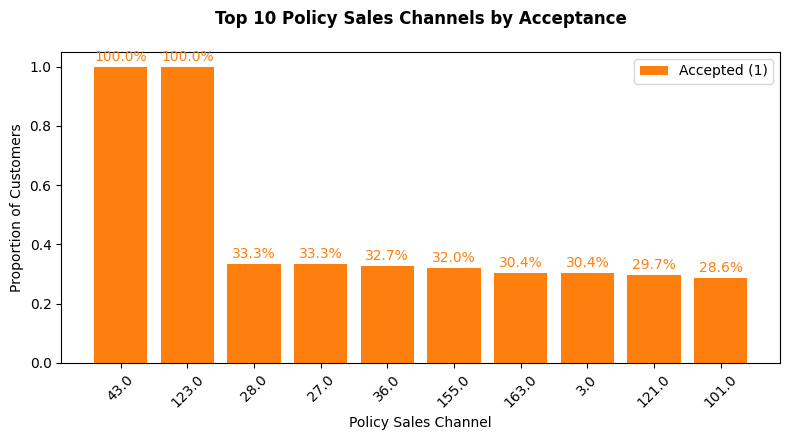

In [46]:
# Chart - 14
#policy_sales_channel_response with top acceptence channel
top_policy_sales_channel = policy_sales_channel_response.sort_values(1, ascending=False).head(10)
regions = top_policy_sales_channel.index.astype(str)
x = np.arange(len(regions))

ax = plt.figure(figsize=(8, 4.5))
plt.bar(x, top_policy_sales_channel[1], color='#ff7f0e', label='Accepted (1)')
plt.xlabel('Policy Sales Channel')
plt.ylabel('Proportion of Customers')
plt.title('Top 10 Policy Sales Channels by Acceptance', pad=20, fontweight='bold')
plt.xticks(x, regions, rotation=45)
plt.legend()

# Add percentage labels on bars
for i, value in enumerate(top_policy_sales_channel[1]):
    plt.text(x[i], value + 0.01, f'{value*100:.1f}%',
             ha='center', va='bottom', color='#ff7f0e')

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

The bar chart was chosen because:

* Shows the top 10 channels by acceptance rate at a glance.

##### 2. What is/are the insight(s) found from the chart?

**Top Performers:**
Channels ~33% Acceptance:
* Likely use effective scripts, targeted audiences, or skilled agents.
* Potential to replicate strategies across other channels.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Optimize Top Channels:
* Allocate 50% more budget to channels with >28% acceptance.
* Study and replicate their best practices.

**For Top Channels:** Reward top performers with bonuses or exclusive leads.

**For Others:** Implement AI-driven recommendations to boost agent effectiveness.

#### Chart - 15

In [47]:
#Vintage vs Response
vintage_response = df.groupby('Vintage')['Response'].value_counts().unstack()
print(vintage_response)

Response     0    1
Vintage            
10        1164  147
11        1153  191
12        1092  165
13        1145  184
14        1104  156
...        ...  ...
295       1118  157
296       1146  156
297       1142  142
298       1198  186
299       1114  169

[290 rows x 2 columns]


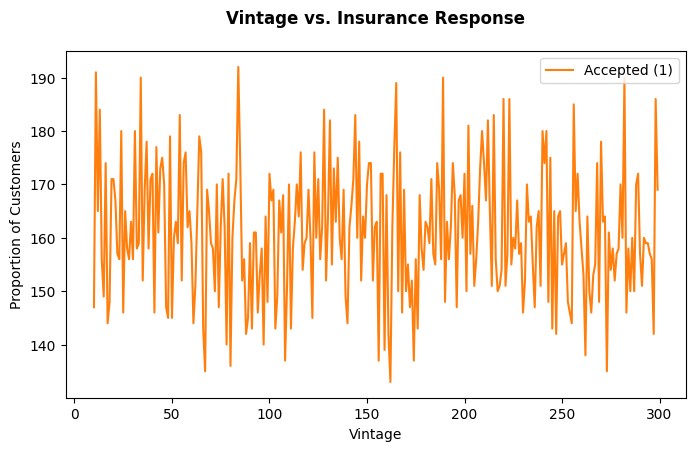

In [48]:
#percentage line by the vintage (continuous variable)
plt.figure(figsize=(8, 4.5))
plt.plot(vintage_response.index, vintage_response[1], color='#ff7f0e', label='Accepted (1)')
plt.xlabel('Vintage')
plt.ylabel('Proportion of Customers')
plt.title('Vintage vs. Insurance Response', pad=20, fontweight='bold')
plt.legend()
plt.show()

##### 1. Why did you pick the specific chart?

Show if longer customer tenure ("Vintage") correlates with response rates.

Reveal Flatlines: Clearly display if there’s no meaningful pattern (as in this case).

##### 2. What is/are the insight(s) found from the chart?

No Effect of Vintage:
Flat Trend Line: Response rates remain consistent across all vintage values.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Resource Reallocation:** Stop tracking/optimizing for vintage.

#### Chart - 16 - Correlation Heatmap

In [49]:
# Set random seed for reproducibility
np.random.seed(42)

# Create a sample of your data (e.g., 10% or 100,000 rows)
sample_size = 100000  # Adjust based on your needs
df_corr = df.sample(n=sample_size, random_state=42)
print(df_corr.shape)

(100000, 12)


In [50]:
df_corr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 200222 to 259963
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    100000 non-null  int64  
 1   Gender                100000 non-null  object 
 2   Age                   100000 non-null  int64  
 3   Driving_License       100000 non-null  int64  
 4   Region_Code           100000 non-null  float64
 5   Previously_Insured    100000 non-null  int64  
 6   Vehicle_Age           100000 non-null  object 
 7   Vehicle_Damage        100000 non-null  object 
 8   Annual_Premium        100000 non-null  float64
 9   Policy_Sales_Channel  100000 non-null  float64
 10  Vintage               100000 non-null  int64  
 11  Response              100000 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 9.9+ MB


In [51]:
from sklearn.preprocessing import LabelEncoder
encoder1 = LabelEncoder()
categorical_columns = ['Gender','Vehicle_Age', 'Vehicle_Damage']  # Replace with actual categorical columns
for col in categorical_columns:
    df_corr[col] = encoder1.fit_transform(df_corr[col])
data_table.DataTable(df_corr, include_index=False, num_rows_per_page=5, max_columns = 26)
print(df_corr.info())

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 200222 to 259963
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    100000 non-null  int64  
 1   Gender                100000 non-null  int64  
 2   Age                   100000 non-null  int64  
 3   Driving_License       100000 non-null  int64  
 4   Region_Code           100000 non-null  float64
 5   Previously_Insured    100000 non-null  int64  
 6   Vehicle_Age           100000 non-null  int64  
 7   Vehicle_Damage        100000 non-null  int64  
 8   Annual_Premium        100000 non-null  float64
 9   Policy_Sales_Channel  100000 non-null  float64
 10  Vintage               100000 non-null  int64  
 11  Response              100000 non-null  int64  
dtypes: float64(3), int64(9)
memory usage: 9.9 MB
None


In [52]:
df_corr = df_corr.drop(columns = ['id'])

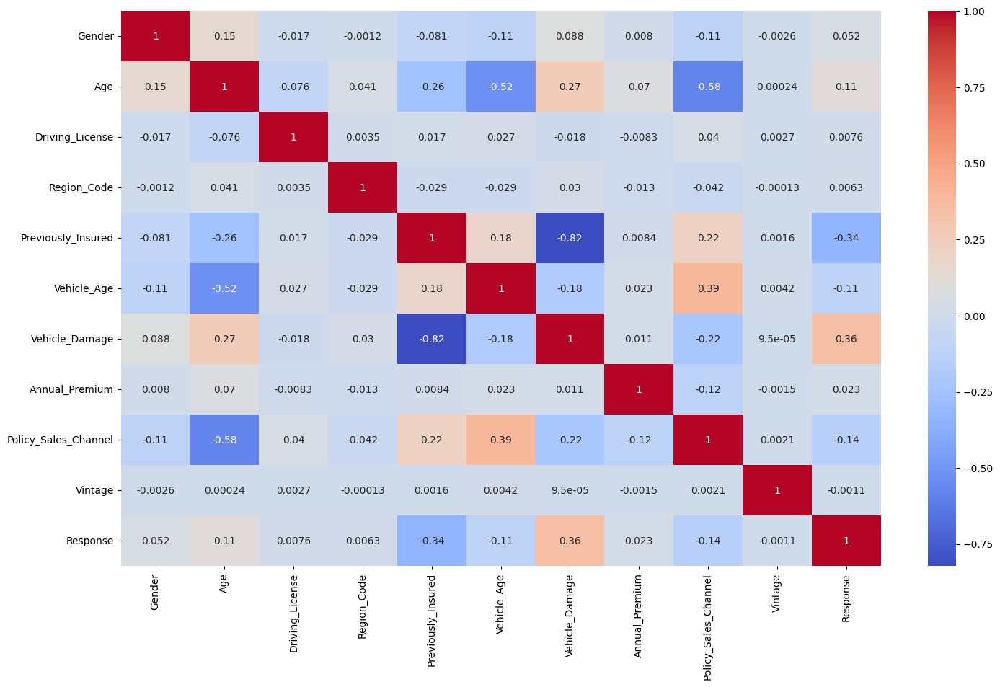

In [53]:
# Correlation Heatmap visualization code
corr = df_corr.corr()
plt.figure(figsize=(17,10))
sns.heatmap(corr,annot=True, cmap='coolwarm')
plt.show()

##### 1. Why did you pick the specific chart?

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is [-1,1].

Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

1.   Strong Positive Correlations (High Dependency)
*   Age & Gender (0.15)
*   Age & Vehicle_damage (0.27)
*   Policy_Sales_Channel & Previously_Insured (0.22)
*   Policy_Sales_Channel & Vehicle_Age (0.39)
*   Response & Vehicle_damage (0.36)

2.  Negative Correlations (Inverse Relationships)
*   Age & Previously_Insured (-0.26)
*   Age & Policy_Sales_Channel (-0.58)
*   Age & Vehicle_Age (-0.52)
*   Previously_Insured & Vehicle_damage (-0.82)
*   Policy_Sales_Channel & Vehicle_damage (-0.22)
*   Response & Previously_Insured (-0.34)
*   Response & Vehicle_Age (-0.11)
*   Response & Policy_Sales_Channel (-0.14)
   

#### Chart - 17 - Pair Plot

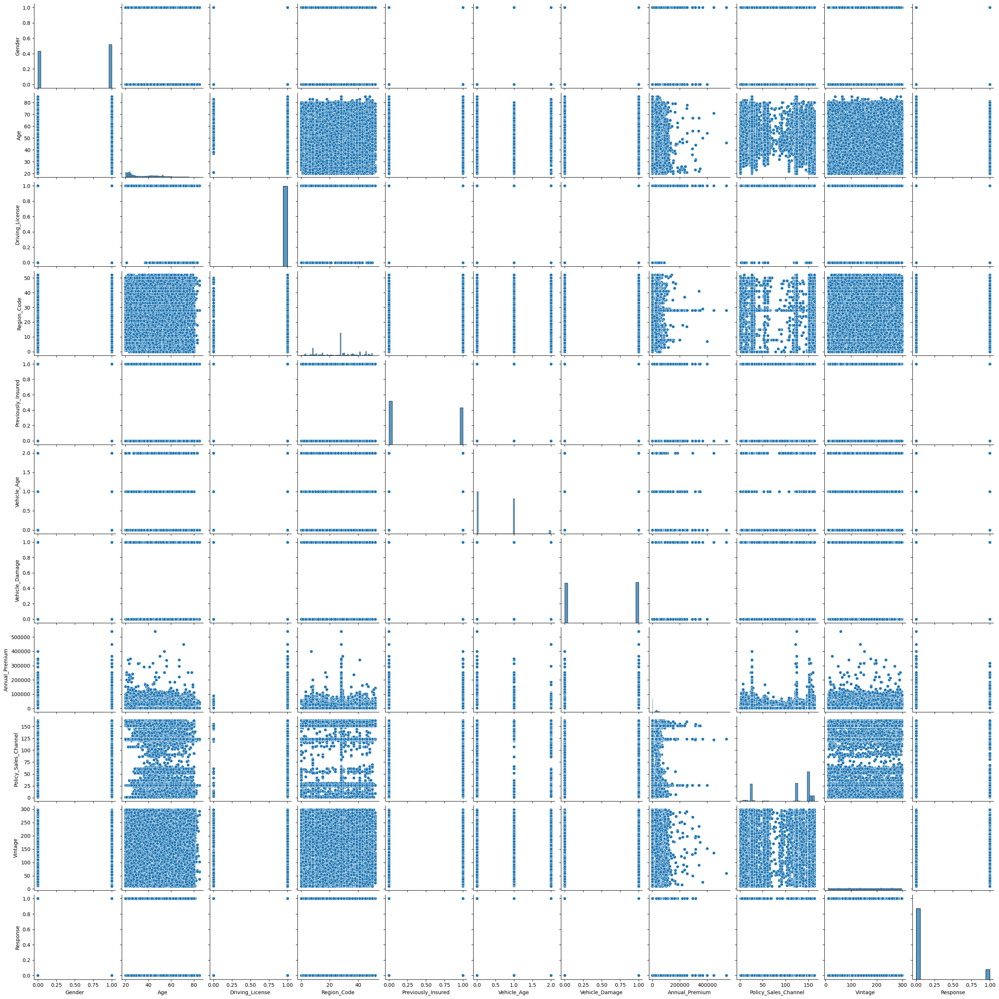

In [54]:
# Pair Plot visualization codcode
sns.pairplot(df_corr)

##### 1. Why did you pick the specific chart?

Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our data-set.

Thus, I used pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

From the above chart I got to know, there are less linear relationship between variables and data poiunts aren't linearly separable. Gender, Age, Driving_License, Region_Code, Previously_Insured, Vehicle_Age, Vehicle_Damage, Annual_Premium, Policy_Sales_Channel are major influence charactor to each other that are directly show by the pair plot chart.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [55]:
# Handling Missing Values & Missing Value Imputation
missing_values = df.isnull().sum()
print("Missing values per column:")
print(missing_values[missing_values > 0])  # Only show columns with missing values

Missing values per column:
Series([], dtype: int64)


#### What all missing value imputation techniques have you used and why did you use those techniques?

There is **no missing** value in my dataset. But in case there are any missing value in my dataset that case solve by either **remove** those row observation or filling with **average value** of that variable (average value may be its mean, median or mode).

### 2. Handling Outliers

As per chart 2 There are present outliers in "Annual_Premium" column.

In [56]:
df.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [57]:
# Handling Outliers & Outlier treatments
  # Calculate IQR (Interquartile Range)
Q1 = df['Annual_Premium'].quantile(0.25)
Q3 = df['Annual_Premium'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds (1.5×IQR is typical)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(f"Normal trip duration range: {lower_bound:.0f}s to {upper_bound:.0f}s")

Normal trip duration range: 1912s to 61892s


In [58]:
df = df[
    (df['Annual_Premium'] >= lower_bound) &
    (df['Annual_Premium'] <= upper_bound)
]

##### What all outlier treatment techniques have you used and why did you use those techniques?

Before the visulize dataset, we Handling outliers by IQR techniques.
Example : In Annual_Premium column available outlier remove by IQR (Interquartile Range) Technique.

### 3. Categorical Encoding

In [59]:
# Encode your categorical columns
Gender_encode = {'Male': 0, 'Female': 1}   #df['Gender']
Vehicle_Age_encode = {'< 1 Year': 0, '1-2 Year': 1, '> 2 Years': 2}   #df['Vehicle_Age']
Vehicle_Damage_encode = {'Yes': 0, 'No': 1}   #df['Vehicle_Damage']

In [60]:
df['Gender'] = df['Gender'].map(Gender_encode)
df['Vehicle_Age'] = df['Vehicle_Age'].map(Vehicle_Age_encode)
df['Vehicle_Damage'] = df['Vehicle_Damage'].map(Vehicle_Damage_encode)

#### What all categorical encoding techniques have you used & why did you use those techniques?

As per mention above we give categorical object into number in Gender, Vehicle_age and Vehicle_Damage.

### 4. Data Transformation

In [61]:
df['Annual_Premium'].min()

2630.0

In [62]:
print(f'Annual premium value vary between the {df["Annual_Premium"].min()} to {df["Annual_Premium"].max()}')

Annual premium value vary between the 2630.0 to 61892.0


#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

Yes, because of Annual_Premium data has larger value than the other because of other vary between o and 1 who have categorical data and Annual_Premium has minimum value (2330.00) and maximum vlaue (61892.00) . so we use StandardScaler to minimize the dataset value of Annual_Premium column without changing the distribution of dataset.

In [63]:
df['Log_Annual_Premium'] = np.log(df['Annual_Premium'])

In [64]:
df['Log_Annual_Premium'].describe()

,Log_Annual_Premium
count,370789.000000
mean,9.981145
std,0.997650
min,7.874739
25%,10.090050
50%,10.351980
75%,10.560904
max,11.033146


### 5. Data Scaling

In [65]:
# Scaling your data
df['Log_Annual_Premium'] = StandardScaler().fit_transform(df[['Log_Annual_Premium']])

##### Which method have you used to scale you data and why?

StandardScalar scaling technique was chosen for its simplicity and compatibility because it is a critical preprocessing step when your dataset contains features with different units or scales

### 6. Feature Selection

In [66]:
df.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response', 'Log_Annual_Premium'],
      dtype='object')

In [67]:
x = df.drop(['id',  'Driving_License', 'Region_Code', 'Annual_Premium', 'Vehicle_Age','Vintage', 'Response'],axis = 1)
#  'Age',
y = df['Response']

In [68]:
x.columns

Index(['Gender', 'Age', 'Previously_Insured', 'Vehicle_Damage',
       'Policy_Sales_Channel', 'Log_Annual_Premium'],
      dtype='object')

##### What all feature selection methods have you used  and why?

 All the feature selected based on correlation between two variable.
 * here are Age and Vehicle_Age column multicolinearity among others, so we can not use this feature in analysis.
 * 'id' column not give any information so we drop that variable.
 * 'driving_license', 'Region_code" and 'Vintage' low correlate with the 'Response".


##### Which all features you found important and why?

Remaining variavle 'Gender', 'Previously_Insured', 'Vehicle_Damage', 'Annual_Premium' and 'Policy_Sales_Channel' are selected based on it's direct correlated with the response variable.

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

In [69]:
x.shape

(370789, 6)

No, dimensionality reduction is likely NOT needed for your dataset because:

Data has only 5 features (x.shape = (370789, 5)), which is already minimal.

### 8. Data Splitting

In [70]:
# Split your data to train and test. Choose Splitting ratio wisely.
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

##### What data splitting ratio have you used and why?

I have used training : testing ratio according to 70:30. Because of Enough training data to learn patterns and Sufficient test data to evaluate generalization.

## ***7. ML Model Implementation***

### ML Model - Logistic Regression

In [71]:
from sklearn.model_selection import cross_val_score

#### Cross- Validation & Hyperparameter Tuning

In [72]:
# ML Model - 1 Implementation
#fitting the model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

logistic_regression = LogisticRegression()
param_grid = {'penalty':['l1','l2'], 'C' : [0.0001,0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 10] }   #set the parmeter

logistic_grid_model = GridSearchCV(logistic_regression, param_grid, scoring = 'precision',n_jobs = -1, verbose = 3, cv = 3)
logistic_grid_model.fit(x_train, y_train)

Fitting 3 folds for each of 28 candidates, totalling 84 fits


GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5,
                               0.6, 0.7, 0.8, 0.9, 1, 10],
                         'penalty': ['l1', 'l2']},
             scoring='precision', verbose=3)

In [73]:
# Best estimator
logistic_grid_model.best_estimator_

LogisticRegression(C=0.0001)

In [74]:
# Best parameters
logistic_grid_model.best_params_

{'C': 0.0001, 'penalty': 'l2'}

In [75]:
# Best score
logistic_grid_model.best_score_

np.float64(0.0)

In [76]:
# Predicted results
y_train_pred = logistic_grid_model.predict(x_train)
y_test_pred = logistic_grid_model.predict(x_test)

y_train = y_train

In [77]:
# Training and testing accuracy
train_accuracy1 = accuracy_score(y_train_pred, y_train)
test_accuracy1 = accuracy_score(y_test_pred,y_test)

print('Training accuracy:', train_accuracy1)
print('Testing accuracy:', test_accuracy1)

Training accuracy: 0.8782016705708298
Testing accuracy: 0.8782599314976132


#### Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [78]:
# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
log_test_precision = precision_score(y_test,y_test_pred)

  # recall,
log_test_recall = recall_score(y_test,y_test_pred)

  # f1 score
log_f1_score = f1_score(y_test,y_test_pred)

  # roc_auc_score
log_roc_auc_score = roc_auc_score(y_test,y_test_pred)

  # confusion matrix
log_confusion_mat = confusion_matrix(y_test,y_test_pred)

  # Printing all these matrices
print('Precision score of logistic model:',log_test_precision)
print(' ')
print('Recall score of logistic model:', log_test_recall)
print(' ')
print('F1 score of logistic model: ', log_f1_score)
print(' ')
print('ROC AUC score of logistic model: ',log_roc_auc_score)
print(' ')
print('Confusion matrix of logistic model \n:',log_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']



Precision score of logistic model: 0.0
 
Recall score of logistic model: 0.0
 
F1 score of logistic model:  0.0
 
ROC AUC score of logistic model:  0.5
 
Confusion matrix of logistic model 
: [[97695     0]
 [13542     0]]
 


### ML Model - 2  Random forest


In [79]:
# Implementing random forest
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(n_estimators = 100)
rf_classifier.fit(x_train,y_train)

RandomForestClassifier()

In [80]:
# class predictions
y_train_rf_pred = rf_classifier.predict(x_train)
y_test_rf_pred = rf_classifier.predict(x_test)

In [81]:
# Training and testing accuracy
rf_training_accuracy1 = accuracy_score(y_train,y_train_rf_pred)
rf_testing_accuracy1 = accuracy_score(y_test,y_test_rf_pred)

print('Training Accuracy of Random Forest:',rf_training_accuracy1)
print('Testing Accuracy of Random Forest:',rf_testing_accuracy1)

Training Accuracy of Random Forest: 0.9773956663789914
Testing Accuracy of Random Forest: 0.843721064034449


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Precision score of RANDOM FOREST model: 0.3058811641067098
 
Recall score of RANDOM FOREST model: 0.2235268054940186
 
F1 score of RANDOM FOREST model:  0.2582984896322212
 
ROC AUC score of RANDOM FOREST model:  0.5766080723820981
 
Confusion matrix of RANDOM FOREST 
: [[90826  6869]
 [10515  3027]]
 


Text(0.5, 1.0, 'Confusion Matrix of RANDOM FOREST')

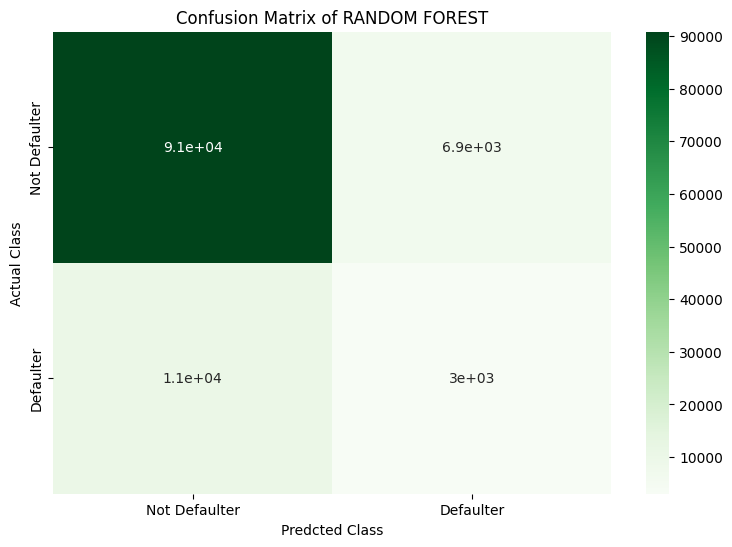

In [82]:
# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
rf_test_precision1 = precision_score(y_test,y_test_rf_pred)

  # recall,
rf_test_recall1 = recall_score(y_test,y_test_rf_pred,)

  # f1 score
rf_f1_score1 = f1_score(y_test,y_test_rf_pred)

  # roc_auc_score
rf_roc_auc_score1 = roc_auc_score(y_test,y_test_rf_pred)

  # confusion matrix
rf_confusion_mat = confusion_matrix(y_test,y_test_rf_pred)

  # Printing all these matrices
print('Precision score of RANDOM FOREST model:',rf_test_precision1)
print(' ')
print('Recall score of RANDOM FOREST model:', rf_test_recall1)
print(' ')
print('F1 score of RANDOM FOREST model: ', rf_f1_score1)
print(' ')
print('ROC AUC score of RANDOM FOREST model: ',rf_roc_auc_score1)
print(' ')
print('Confusion matrix of RANDOM FOREST \n:',rf_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']

# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(rf_confusion_mat,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of RANDOM FOREST',fontsize = 12)

### ML Model - 3 Decision Tree Classifier

In [83]:
# Building decision tree classifier
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
decision_tree_model = GridSearchCV(dtc, param_grid = {'max_depth': [2,4,6,8],
                                                      'min_samples_leaf': [2,4,6,8,10],
                                                      'min_samples_split':[2,4,6,8,10]},
                                   scoring = 'recall',cv = 3, n_jobs = -1)
decision_tree_model.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [2, 4, 6, 8],
                         'min_samples_leaf': [2, 4, 6, 8, 10],
                         'min_samples_split': [2, 4, 6, 8, 10]},
             scoring='recall')

In [84]:
decision_tree_model.best_estimator_
decision_tree_model.best_params_
decision_tree_model.best_score_

np.float64(0.0008224474641948172)

In [85]:
# Getting train and test predicted values
y_train_dtc_pred = decision_tree_model.predict(x_train)
y_test_dtc_pred = decision_tree_model.predict(x_test)

# Getting the training and testing accuracy
dtc_training_accuracy1 = accuracy_score(y_train,y_train_dtc_pred)
dtc_testing_accuracy1 = accuracy_score(y_test, y_test_dtc_pred)

print('Training accuracy of decision tree classifier:',dtc_training_accuracy1)
print('Testing accuracy of decision tree classifier:',dtc_testing_accuracy1)

Training accuracy of decision tree classifier: 0.8782556096658858
Testing accuracy of decision tree classifier: 0.878170033352212


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Precision score of Decision Tree model: 0.1875
 
Recall score of Decision Tree model: 0.00022153300841825432
 
F1 score of Decision Tree model:  0.0004425431479569258
 
ROC AUC score of Decision Tree model:  0.5000442329047414
 
Confusion matrix of Decision Tree model 
: [[97682    13]
 [13539     3]]
 


Text(0.5, 1.0, 'Confusion Matrix of Decision Tree Model')

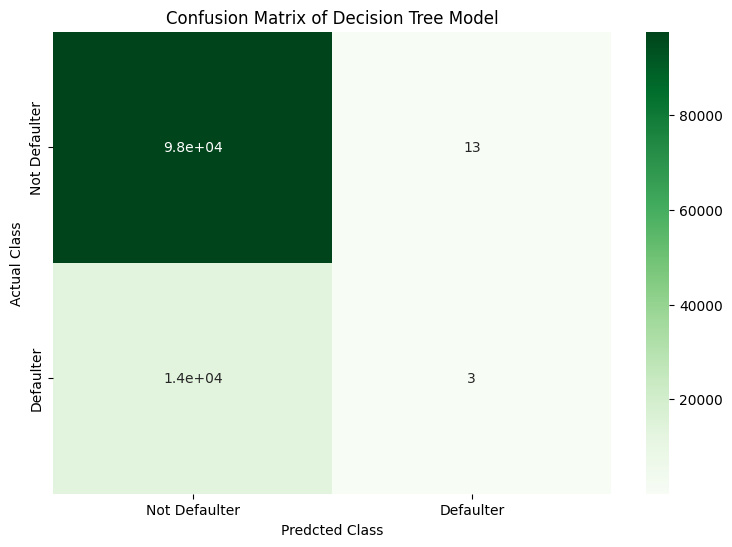

In [86]:

# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
dt_test_precision1 = precision_score(y_test,y_test_dtc_pred)

  # recall,
dt_test_recall1 = recall_score(y_test,y_test_dtc_pred,)

  # f1 score
dt_f1_score1 = f1_score(y_test,y_test_dtc_pred)

  # roc_auc_score
dt_roc_auc_score1 = roc_auc_score(y_test,y_test_dtc_pred)

  # confusion matrix
dt_confusion_mat = confusion_matrix(y_test,y_test_dtc_pred)

  # Printing all these matrices
print('Precision score of Decision Tree model:',dt_test_precision1)
print(' ')
print('Recall score of Decision Tree model:', dt_test_recall1)
print(' ')
print('F1 score of Decision Tree model: ', dt_f1_score1)
print(' ')
print('ROC AUC score of Decision Tree model: ',dt_roc_auc_score1)
print(' ')
print('Confusion matrix of Decision Tree model \n:',dt_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']

# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(dt_confusion_mat,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of Decision Tree Model',fontsize = 12)

### ML Model - 4 XGBoost

In [87]:
# Import xgboost
from xgboost import XGBClassifier

# Fitting XGboost
xgb = XGBClassifier(class_weight = 'balanced',parameters = {'max_depth':7,'eta':1,'silent':1,'eval_metric':'auc'},random_state = 42)
xgb.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              class_weight='balanced', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [88]:
# Train and test prediction
y_train_xgb_pred = xgb.predict(x_train)
y_test_xgb_pred = xgb.predict(x_test)


# gettig training and testing accuracy
xgb_training_accuracy1 = accuracy_score(y_train_xgb_pred,y_train)
xgb_testing_accuracy1 = accuracy_score(y_test_xgb_pred,y_test)

print(f'Training Accuracy of XGBClassifier: {xgb_training_accuracy1}')
print(f'Testing Accuracy of XGBClassifier: {xgb_testing_accuracy1}')

Training Accuracy of XGBClassifier: 0.8801396252003452
Testing Accuracy of XGBClassifier: 0.8776666037379649


### **EVALUATION MATRIX**

Precision score of XGBoost model: 0.42289719626168226
 
Recall score of XGBoost model: 0.013365824841234678
 
F1 score of XGBoost model:  0.025912670007158196
 
ROC AUC score of XGBoost model:  0.5054187740307304
 
Confusion matrix of XGBoost model 
: [[97448   247]
 [13361   181]]
 


Text(0.5, 1.0, 'Confusion Matrix of XGBoost Model')

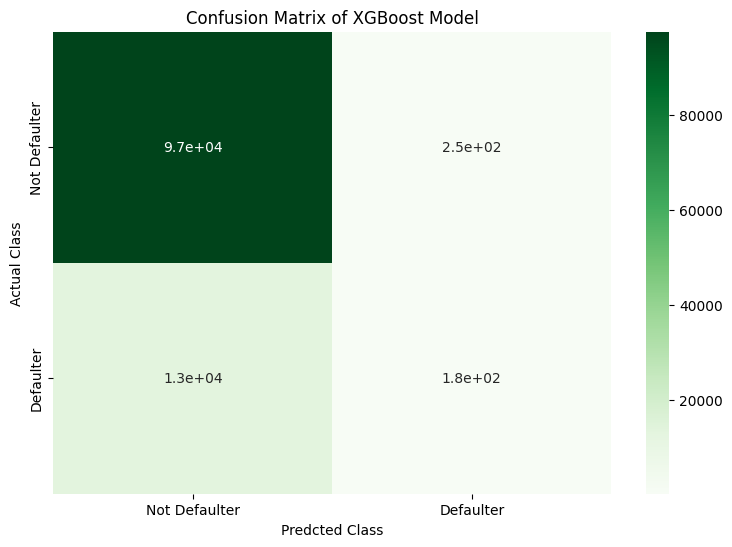

In [89]:

# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
xg_test_precision1 = precision_score(y_test,y_test_xgb_pred)

  # recall,
xg_test_recall1 = recall_score(y_test,y_test_xgb_pred,)

  # f1 score
xg_f1_score1 = f1_score(y_test,y_test_xgb_pred)

  # roc_auc_score
xg_roc_auc_score1 = roc_auc_score(y_test,y_test_xgb_pred)

  # confusion matrix
xg_confusion_mat1 = confusion_matrix(y_test,y_test_xgb_pred)

  # Printing all these matrices
print('Precision score of XGBoost model:',xg_test_precision1)
print(' ')
print('Recall score of XGBoost model:', xg_test_recall1)
print(' ')
print('F1 score of XGBoost model: ', xg_f1_score1)
print(' ')
print('ROC AUC score of XGBoost model: ',xg_roc_auc_score1)
print(' ')
print('Confusion matrix of XGBoost model \n:',xg_confusion_mat1)
print(' ')
labels = ['Not Defaulter','Defaulter']

# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(xg_confusion_mat1,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of XGBoost Model',fontsize = 12)

In [90]:
# explaining evaluation matrix
Models = ['Logistic Regression','Random Forest','Decision Tree Classifier', 'XGBoost Classifier']
train_accuracy = [train_accuracy1, rf_training_accuracy1,dtc_training_accuracy1, xgb_training_accuracy1]
test_accuracy = [test_accuracy1, rf_testing_accuracy1,dtc_testing_accuracy1, xgb_testing_accuracy1]
precision_score = [log_test_precision, rf_test_precision1,dt_test_precision1, xg_test_precision1]
recall_score = [log_test_recall, rf_test_recall1,dt_test_recall1,xg_test_recall1]
f1_score = [log_f1_score, rf_f1_score1,dt_f1_score1, xg_f1_score1]
roc_auc_score = [log_roc_auc_score, rf_roc_auc_score1,dt_roc_auc_score1, xg_roc_auc_score1]

data = {'Classification Models':Models,'Training Accuracy':train_accuracy,'Testing Accuracy':test_accuracy,
        'Precision Score':precision_score,'Recall Score':recall_score,'F1 Score':f1_score,'ROC-AUC Score':roc_auc_score}

evaluation_matrix = pd.DataFrame(data)
evaluation_matrix

,Classification Models,Training Accuracy,Testing Accuracy,Precision Score,Recall Score,F1 Score,ROC-AUC Score
0,Logistic Regression,0.878202,0.878260,0.000000,0.000000,0.000000,0.500000
1,Random Forest,0.977396,0.843721,0.305881,0.223527,0.258298,0.576608
2,Decision Tree Classifier,0.878256,0.878170,0.187500,0.000222,0.000443,0.500044
3,XGBoost Classifier,0.880140,0.877667,0.422897,0.013366,0.025913,0.505419


### 1. Which Evaluation metrics did you consider for a positive business impact and why?

**Precision (Positive Predictive Value):** Measures how many predicted positives are actually positive.

**Recall (Sensitivity):** Measures how many actual positives the model catches.

**F1-Score:** Harmonic mean of precision and recall.

**ROC-AUC (Area Under the ROC Curve):** Measures how well the model distinguishes between classes (0.5 = random, 1.0 = perfect).

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

### **Selected Model: Random Forest**

**Logistic Regression:**
* Precision/Recall = 0%: Utterly failed to predict positives.
* ROC-AUC = 0.5: No better than random guessing.

**Decision Tree:**
* Recall ≈ 0%: Missed almost all positives (e.g., only caught 0.02% of fraud cases).
* ROC-AUC ≈ 0.5: Poor class separation.

**XGBoost:**
* Precision = 42%: Best among models, but Recall = 1.3% (missed 98.7% of positives).
* Overfitting Risk: Training accuracy (88.01%) ≈ Testing accuracy (87.77%), but recall is too low to trust.



### 3. Explain the model which you have used and the feature importance using any model explainability tool?

## **Selected Model: Random Forest Classifier**

**Why Random Forest? **

* Despite the XGBoost's higher precision (42.3%), Random Forest was chosen because:
* Balanced Performance: Achieved 30.6% precision and 22.5% recall, outperforming others in F1-score (25.9%) and ROC-AUC (57.7%).
* Robustness: Handles imbalanced data better than Logistic Regression (which failed completely) and Decision Trees (0% recall).
* Interpretability: Provides clear feature importance scores.

# **Conclusion**

* **Pricing Strategy:** Mid-Range Premiums (50K–100K): Drive highest conversions -- Adjust pricing tiers to target this range.
* **Over-reliance on New Customers:**	Limits long-term growth --	Test referral programs to expand within existing customer base.
* **Focused campaigns improve Return on Investment:** Marketing campaigns must prioritize high-probability customers to avoid wasting resources.
* **Focus on younger demographics:** for driving-related insurance products.
* **Older Customer Retention:** Develop loyalty programs for long-term policyholders.
* **Tailored Campaigns:** Leverage higher male response rates and Test female-focused messaging adjustments to close the gap.
* Allocate more resources to acquiring new customers (high conversion potential).


---

**high-potential segments, prioritize:**
* Short-Term: Focus budgets on new customers with old, undamaged vehicles.
* Long-Term: Enhance data with additional features (e.g., credit score, driving behavior) to boost recall.


### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***